# Understanding User Perceptions of Movies: 
# A Sentiment and Network Analysis of Reviews, Ratings, and Genres

In this Notebook we analyze IMDb and GroupLens datasets with hope to gain insight into what movie reviews from users can tell us about the movie, how movies are related by themes and if there is a pattern in audience engagement.

Authors:

Malfridur Anna Eiriksdottir, s240116

Valgerdur Asgeirsdottir, s242685

In [1]:
import os
import re
import random
from itertools import combinations
from collections import Counter
import glob

import numpy as np
import pandas as pd
import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib import colors as mcolors
from scipy.stats import pearsonr, f_oneway
from scipy.spatial import ConvexHull
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from wordcloud import WordCloud, STOPWORDS
import networkx as nx
from networkx.algorithms.community import louvain_communities
import string


We begin by analyzing the sentiment of a sample of movie reviews for each movie in the dataset. Then combine the results with genre and rating data for each of the movies to see if there are some obvious patterns.

In [2]:

def load_sentiment_word_list(word_list_path):
    
    """ Loads the LabMT word list and return a dictionary of words and their happiness scores. """
    
    try:
        sentiment_words = pd.read_csv(
            word_list_path, sep="\t", comment="#", skip_blank_lines=True
        )
        return dict(zip(sentiment_words["word"], sentiment_words["happiness_average"]))
        
    except Exception as e:
        
        raise ValueError(f"Error reading word list: {e}")


def extract_word_list_from_reviews(file_path, max_reviews=100):
    
    """ Extracts a list of all words by sampling up to max_reviews reviews from a movie file (100) """
    
    try:
        movie_reviews = pd.read_csv(file_path)
        # Sample max_reviews reviews or take all if fewer exist
        sampled_reviews = movie_reviews["review"].dropna().sample(
            n=max_reviews, replace=False, random_state=42
        ) if len(movie_reviews) > max_reviews else movie_reviews["review"].dropna()
        # Combine all sampled reviews into one large text block, then split into words
        word_list = " ".join(sampled_reviews).split()
        return [word.lower() for word in word_list]
        
    except Exception as e:
        
        print(f"Error processing {file_path}: {e}")
        return []


def analyze_sentiment_for_words(word_list, happiness_dict):
    
    """ Analyzes the sentiment of a word list using the LabMT happiness dictionary. """
    
    positive_count = 0
    negative_count = 0
    scores = []

    for word in word_list:
        if word in happiness_dict:
            score = happiness_dict[word]
            scores.append(score)
            if score >= 6:
                positive_count += 1
            elif score <= 4:
                negative_count += 1

    avg_sentiment = np.mean(scores) if scores else np.nan
    
    return avg_sentiment, positive_count, negative_count


def strip_year_from_title(title):
    """ Remove the year from the end of a movie title (how it appears in the dataset) """
    
    return re.sub(r"\s+\d{4}$", "", title.strip())


def merge_genres_and_ratings(sentiment_df, genre_folder_path):
    
    """ Merge genres and ratings from genre files into the sentiment DataFrame. """
    
    genre_files = [
        os.path.join(genre_folder_path, f)
        for f in os.listdir(genre_folder_path)
        if f.endswith(".csv")
    ]
    genre_data = []
    for genre_file in genre_files:
        genre_name = os.path.basename(genre_file).replace(".csv", "")
        file_path = genre_file

        try:
            movies = pd.read_csv(file_path)[["name", "rating"]]
            movies["name"] = movies["name"].apply(strip_year_from_title)
            for _, row in movies.iterrows():
                genre_data.append({"movie": row["name"], "genre": genre_name, "rating": row["rating"]})
        except Exception as e:
            print(f"Error reading genre file {genre_file}: {e}")

    genre_df = pd.DataFrame(genre_data)
    
    # Merge genres and ratings into the sentiment DataFrame
    merged_df = sentiment_df.merge(genre_df, on="movie", how="left")
    grouped_df = merged_df.groupby("movie").agg({
        "avg_sentiment": "first",
        "positive_count": "first",
        "negative_count": "first",
        "word_count": "first",
        "genre": lambda x: list(x.dropna()),
        "rating": "first"
    }).reset_index()
    return grouped_df


def analyze_movie_sentiments(folder_path, word_list_path, genre_folder_path, max_reviews=100):
    
    """ Analyzes the average happiness score for movies, merge with genres and ratings. """
    
    happiness_dict = load_sentiment_word_list(word_list_path)

    results = []
    for file_name in os.listdir(folder_path):
        if file_name.endswith(".csv"):
            file_path = os.path.join(folder_path, file_name)
            # Extract all words by sampling up to max_reviews reviews
            word_list = extract_word_list_from_reviews(file_path, max_reviews)
            # Analyze the sentiment of the word list
            avg_sentiment, positive_count, negative_count = analyze_sentiment_for_words(word_list, happiness_dict)
            # Save the result with the movie title cleaned
            results.append({
                'movie': strip_year_from_title(file_name.replace('.csv', '')),
                'avg_sentiment': avg_sentiment,
                'positive_count': positive_count,
                'negative_count': negative_count,
                'word_count': len(word_list)
            })

    # Convert results to DataFrame
    sentiment_df = pd.DataFrame(results)

    # Merge genres and ratings
    sentiment_with_genres_and_ratings = merge_genres_and_ratings(sentiment_df, genre_folder_path)

    return sentiment_with_genres_and_ratings

folder_path = "dataset/reviews"  # Folder containing movie reviews
word_list_path = "labMIT-1.0.txt"  # The LabMT word list
genre_folder_path = "dataset/1_movies_per_genre"  # Folder containing genre files
max_reviews = 100 # We sample 100 movie reviews for each movie

movie_sentiments_with_genres_and_ratings = analyze_movie_sentiments(
    folder_path, word_list_path, genre_folder_path, max_reviews)

# Sort results to get top/bottom 10 movies
top_movies = movie_sentiments_with_genres_and_ratings.sort_values(by="avg_sentiment", ascending=False).head(10)
bottom_movies = movie_sentiments_with_genres_and_ratings.sort_values(by="avg_sentiment", ascending=True).head(10)

# Print results
print("Top 10 Movies with Highest Sentiment Scores:")
print(top_movies[["movie", "avg_sentiment", "positive_count", "negative_count", "rating", "genre"]].to_string(index=False))

print("\nTop 10 Movies with Lowest Sentiment Scores:")
print(bottom_movies[["movie", "avg_sentiment", "positive_count", "negative_count", "rating", "genre"]].to_string(index=False))

Top 10 Movies with Highest Sentiment Scores:
                                          movie  avg_sentiment  positive_count  negative_count  rating              genre
                                  Walk the Line       5.537905            4545             714     7.8 [Music, Biography]
                                            Elf       5.536370            3330             509     6.9          [Fantasy]
                             The Wedding Singer       5.533905            2807             422     6.8            [Music]
                                          Honey       5.527231            3936             662     5.4            [Music]
                               Music and Lyrics       5.520725            4241             616     6.5            [Music]
Eurovision Song Contest: The Story of Fire Saga       5.519760            1549             259     6.6            [Music]
                                  Dirty Dancing       5.519326            3416             578     7.

100 reviews were sampled for each movie since processing the over 1 million reviews was deamed unfeasible. 

We can clearly see some interesting patterns with the results for the 10 highest sentiment movie's reviews and the 10 lowest. The high sentiment movies are most in the Music genre, with some in Fantasy, Biography and Romance, while the low sentiment movies are in the War, Horror and History genres. The ratings for the two groups also seem similar as well as the positive word count. The sentiment of the reviews seems to follow the theme of the movie. This is very interesting, but we need to analyze more than 20 movies to fully draw conclusions.

In [3]:

def analyze_word_counts_and_ratings(sentiment_df, top_n=100):
    
    """ Analyze and compare the positive and negative word counts and ratings 
    for the top 100 and bottom 100 movies by average sentiment. """
    
    # Sort to get the top N and bottom N movies
    top_movies = sentiment_df.sort_values(by='avg_sentiment', ascending=False).head(top_n)
    bottom_movies = sentiment_df.sort_values(by='avg_sentiment', ascending=True).head(top_n)
    
    # Calculate averages for top N movies
    top_avg_positive = top_movies['positive_count'].mean()
    top_avg_negative = top_movies['negative_count'].mean()
    top_avg_rating = top_movies['rating'].mean()

    # Calculate averages for bottom N movies
    bottom_avg_positive = bottom_movies['positive_count'].mean()
    bottom_avg_negative = bottom_movies['negative_count'].mean()
    bottom_avg_rating = bottom_movies['rating'].mean()
    
    # Create a summary dictionary
    results = {
        "Top 100 Movies": {
            "Average Positive Word Count": top_avg_positive,
            "Average Negative Word Count": top_avg_negative,
            "Average Rating": top_avg_rating
        },
        "Bottom 100 Movies": {
            "Average Positive Word Count": bottom_avg_positive,
            "Average Negative Word Count": bottom_avg_negative,
            "Average Rating": bottom_avg_rating
        }
    }
    
    print("Comparison of Positive and Negative Word Counts and Ratings:\n")
    print(f"Top {top_n} Movies with Highest Sentiment Scores (Averages):")
    print(f"  Average Positive Word Count: {top_avg_positive}")
    print(f"  Average Negative Word Count: {top_avg_negative}")
    print(f"  Average Rating: {top_avg_rating}")
    
    print(f"\nBottom {top_n} Movies with Lowest Sentiment Scores (Averages):")
    print(f"  Average Positive Word Count: {bottom_avg_positive}")
    print(f"  Average Negative Word Count: {bottom_avg_negative}")
    print(f"  Average Rating: {bottom_avg_rating}")
    
    return results

comparison_results = analyze_word_counts_and_ratings(movie_sentiments_with_genres_and_ratings, top_n=100)


Comparison of Positive and Negative Word Counts and Ratings:

Top 100 Movies with Highest Sentiment Scores (Averages):
  Average Positive Word Count: 3784.13
  Average Negative Word Count: 634.09
  Average Rating: 7.401

Bottom 100 Movies with Lowest Sentiment Scores (Averages):
  Average Positive Word Count: 3510.3
  Average Negative Word Count: 1240.39
  Average Rating: 7.138


Here we can see the positive and negative word counts for the reviews with the highest and lowest sentiment scores. The difference in the positive word count is a bit surprising since it is very small, we would think that the lowest sentiment reviews would have very few positive words to show a dislike for the movie. The main difference in the high and low sentiment in reviews seems to lie in the negative word count. The lower sentiment movies have almost a double amount of negative words. We have also calculated the average rating for these films, but there does not seem to be a large difference between the low and high sentiment groups in ratings.

Is there a correlation between average sentiment of reviews and a movie's rating?

In [4]:

def perform_pearson_correlation(sentiment_df):
    
    """ Performs a Pearson correlation test between average sentiment and rating. """
    
    # Drop rows with missing or non-numeric values in avg_sentiment and rating
    filtered_df = sentiment_df.dropna(subset=["avg_sentiment", "rating"]).copy()
    filtered_df.loc[:, "rating"] = pd.to_numeric(filtered_df["rating"], errors="coerce")
    filtered_df = filtered_df.dropna(subset=["rating"])

    # Perform Pearson correlation test
    correlation, p_value = pearsonr(filtered_df["avg_sentiment"], filtered_df["rating"])

    # Print results
    print(f"Pearson Correlation: {correlation:.4f}")
    print(f"P-Value: {p_value:.4g}")

perform_pearson_correlation(movie_sentiments_with_genres_and_ratings)


Pearson Correlation: 0.0574
P-Value: 0.05254


The results from the Pearson test tell us with a low correlation coefficient and a high p-value (>0.05) that there is no evidence for a correlation between average sentiment and rating. These results are surprising as one might think that a movie with a low rating would have a very negative sentiment in reviews and a highly rated movie would have overall positive reviews. This tells us that there are other factors that affect a movie's review sentiment.

Is there a correlation between average sentiment score of reviews and a movie's genre?

In [5]:

def analyze_genre_sentiment_correlation(sentiment_df):
    
    """ Analyze the relationship between average sentiment scores and genres using the ANOVA method. """
    
    # Ensure genres are lists and explode them into separate rows
    sentiment_df = sentiment_df.explode('genre').dropna(subset=['genre', 'avg_sentiment'])
    
    # Group average sentiment scores by genres
    genre_groups = sentiment_df.groupby('genre')['avg_sentiment'].apply(list)
    
    # Perform ANOVA correlation test
    anova_result = f_oneway(*genre_groups)
    print("ANOVA Results:")
    print(f"F-statistic: {anova_result.statistic:.4f}, p-value: {anova_result.pvalue:.4g}")

analyze_genre_sentiment_correlation(movie_sentiments_with_genres_and_ratings)


ANOVA Results:
F-statistic: 79.1646, p-value: 6.347e-192


The results from the ANOVA test show that there is a highly significant relationship between genre and average sentiment in reviews with a very high F-statistic and a very low p-value (<0.05). This is exciting but the nature of this relationship remains unknown, for now.

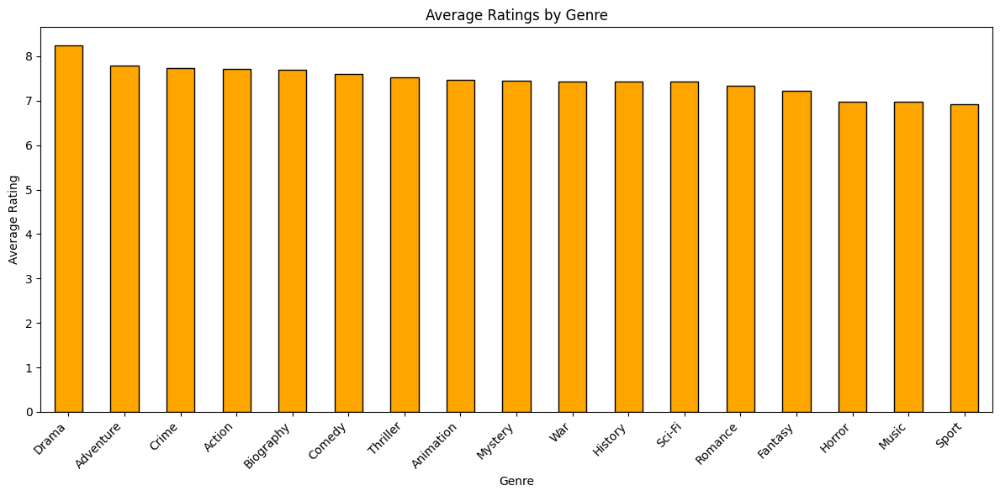

In [6]:

def plot_genre_ratings(sentiment_df):
    
    """ Plot the average rating for each genre. """
    
    # Explode the genre column into separate rows
    exploded_df = sentiment_df.explode('genre').dropna(subset=['genre', 'rating'])
    
    # Ensure ratings are numeric
    exploded_df['rating'] = pd.to_numeric(exploded_df['rating'], errors='coerce')
    
    # Calculate the average rating for each genre
    avg_ratings = exploded_df.groupby('genre')['rating'].mean().sort_values(ascending=False)
    
    # Plot the average ratings
    plt.figure(figsize=(12, 6))
    avg_ratings.plot(kind='bar', color='orange', edgecolor='black')
    plt.title("Average Ratings by Genre")
    plt.xlabel("Genre")
    plt.ylabel("Average Rating")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

plot_genre_ratings(movie_sentiments_with_genres_and_ratings)


This plot shows the average rating for each genre. Drama has the highest average rating of around 8.4 while Sport films have the lowest. This is not very surprising as Oscar nominated films rather tend to belong to the Drama genre than Sport. There is not a very large difference in ratings between genres, but it still looks somewhat significant. Since there was not found to be correlation between sentiment in reviews and rating, this was not further investigated.

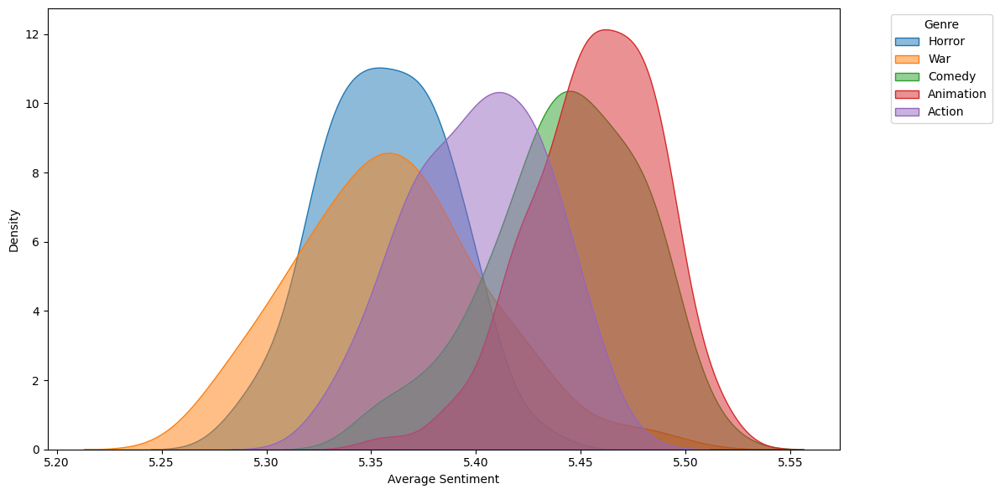

In [7]:

def plot_sentiment_density(sentiment_df):
    
    """ Plot the density of average sentiment scores for 5 specified genres with accurate legends. """
    
    # Explode the 'genre' column into separate rows
    exploded_df = sentiment_df.explode('genre').dropna(subset=['genre', 'avg_sentiment'])
    
    # Ensure the 'genre' column is a valid string type
    exploded_df['genre'] = exploded_df['genre'].astype(str)
    
    # Five different genres are selected for the plot
    selected_genres = ["Horror", "War", "Comedy", "Animation", "Action"]
    
    # Filter the DataFrame to include only these specific genres
    filtered_df = exploded_df[exploded_df['genre'].isin(selected_genres)]
    
    # Check if the filtered DataFrame is not empty
    if filtered_df.empty:
        print("No data available for the selected genres.")
        return

    # Create the plot explicitly for each genre
    plt.figure(figsize=(12, 6))
    for genre in selected_genres:
        genre_data = filtered_df[filtered_df['genre'] == genre]
        sns.kdeplot(
            data=genre_data,
            x="avg_sentiment",
            fill=True,
            alpha=0.5,
            common_norm=False,
            label=genre)

    plt.xlabel("Average Sentiment")
    plt.ylabel("Density")
    plt.legend(title="Genre", loc="upper right", bbox_to_anchor=(1.2, 1))
    plt.tight_layout()
    plt.savefig('sentiment_density_selected_genres.png', dpi=300)
    plt.show()

plot_sentiment_density(movie_sentiments_with_genres_and_ratings)


This plot shows the sentiment density in the reviews of the genres Horror, War, Comedy, Animation and Action. These genres were selected for the illustration because they show the range of the average sentiment well. Horror and War have a lower sentiment average, Comedy and Animation have a higher sentiment average and Action overlaps both groups. The genres that we would expect to have happier themes, Animation and Comedy have a density peak at a higher sentiment while Horror and War are the opposite.

In [8]:

def find_top_and_bottom_sentiment_genres(sentiment_df, top_n=3):
    
    """ Finds the top 3 (or n) genres with the highest and lowest average sentiment scores. """
    
    # Explode the 'genre' column into separate rows
    exploded_df = sentiment_df.explode('genre').dropna(subset=['genre', 'avg_sentiment'])
    
    # Ensure the 'genre' column is a valid string type
    exploded_df['genre'] = exploded_df['genre'].astype(str)
    
    # Group by genre and calculate the average sentiment for each genre
    genre_avg_sentiments = exploded_df.groupby('genre')['avg_sentiment'].mean().sort_values()
    
    # Get the top 3 lowest and highest average sentiment genres
    lowest_genres = genre_avg_sentiments.head(top_n)
    highest_genres = genre_avg_sentiments.tail(top_n)
    
    print(f"Top {top_n} Genres with the Highest Average Sentiment Scores:")
    print(highest_genres)
    print(f"\nTop {top_n} Genres with the Lowest Average Sentiment Scores:")
    print(lowest_genres)
    
    return highest_genres, lowest_genres

top_genres, bottom_genres = find_top_and_bottom_sentiment_genres(movie_sentiments_with_genres_and_ratings, top_n=3)


Top 3 Genres with the Highest Average Sentiment Scores:
genre
Romance      5.450049
Music        5.456040
Animation    5.456340
Name: avg_sentiment, dtype: float64

Top 3 Genres with the Lowest Average Sentiment Scores:
genre
Horror     5.356611
War        5.359317
Mystery    5.380261
Name: avg_sentiment, dtype: float64


Here are the top three genres with the highest and lowest average sentiment scores in their reviews. The highest sentiment genres generally have similar themes that are positive while the lowest are known to have negative or even scary themes. We know genre and average sentiment score are correlated but this gives us a better idea of how.

No matching genres found for movie: Blade Runner 2049
No matching genres found for movie: Conquest 1453
No matching genres found for movie: The Legend of 1900
Word cloud saved for genre: Horror -> wordclouds/Horror_wordcloud.png


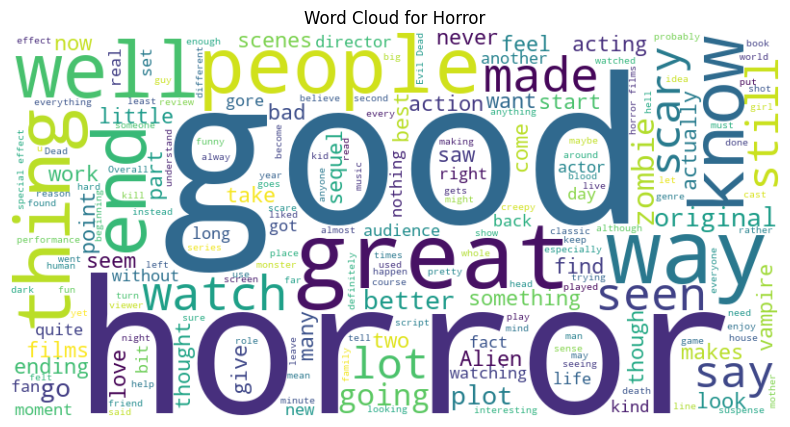

Word cloud saved for genre: Mystery -> wordclouds/Mystery_wordcloud.png


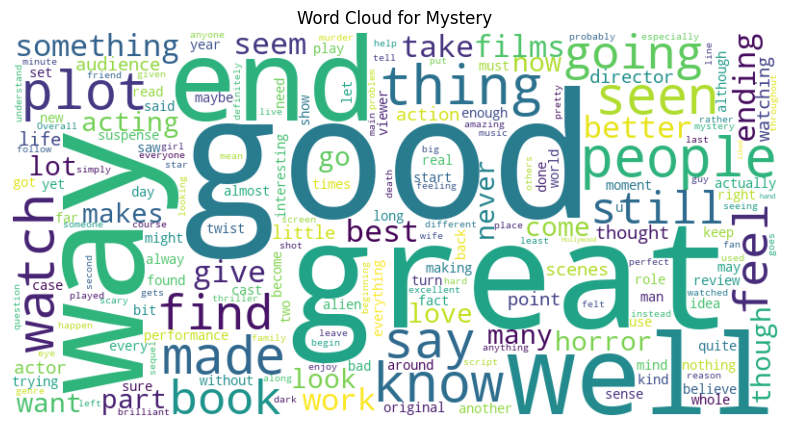

Word cloud saved for genre: Romance -> wordclouds/Romance_wordcloud.png


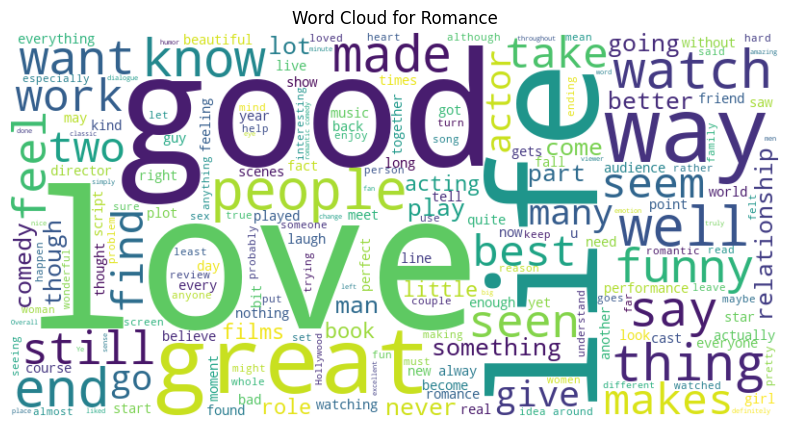

Word cloud saved for genre: Crime -> wordclouds/Crime_wordcloud.png


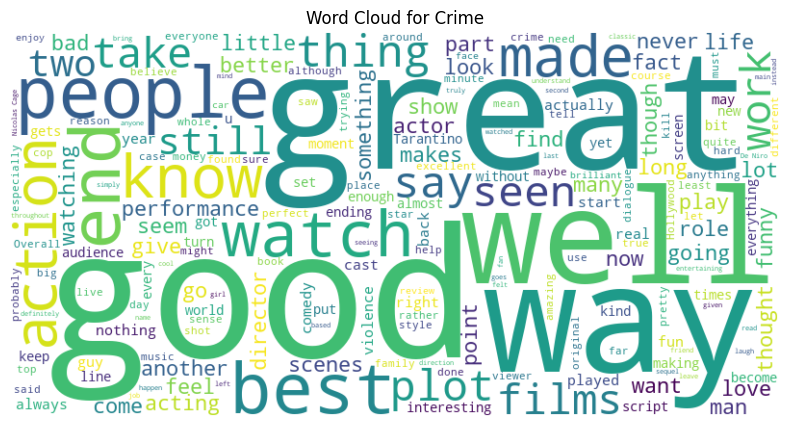

Word cloud saved for genre: Drama -> wordclouds/Drama_wordcloud.png


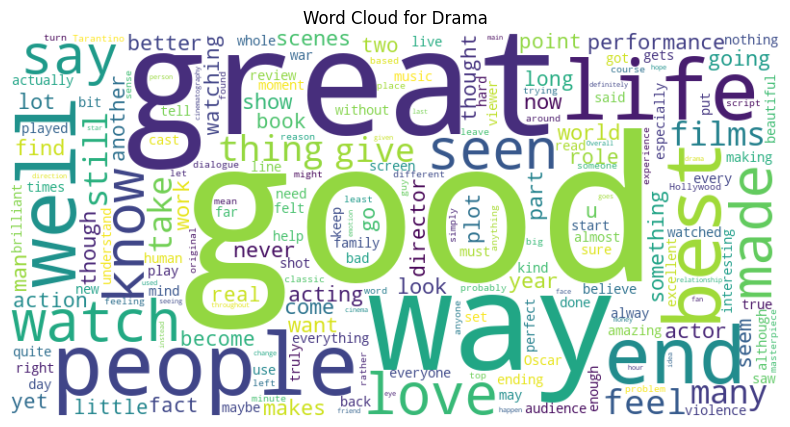

Word cloud saved for genre: Sci-Fi -> wordclouds/Sci-Fi_wordcloud.png


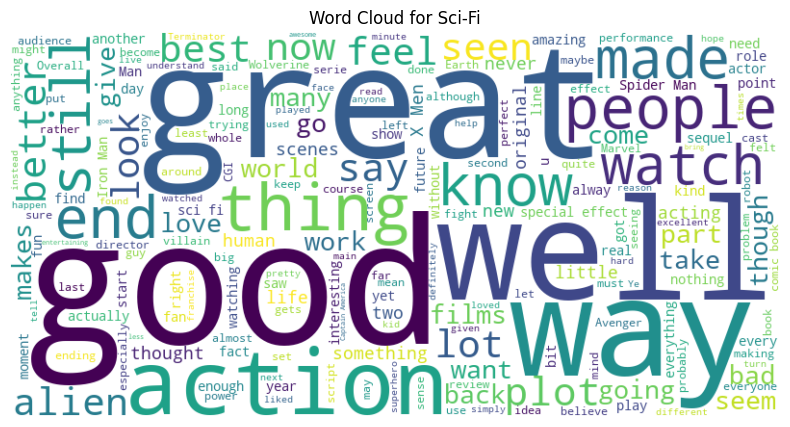

Word cloud saved for genre: Thriller -> wordclouds/Thriller_wordcloud.png


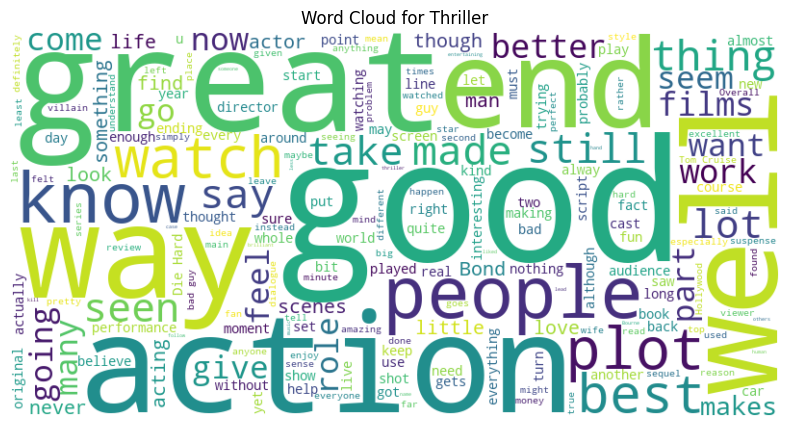

Word cloud saved for genre: History -> wordclouds/History_wordcloud.png


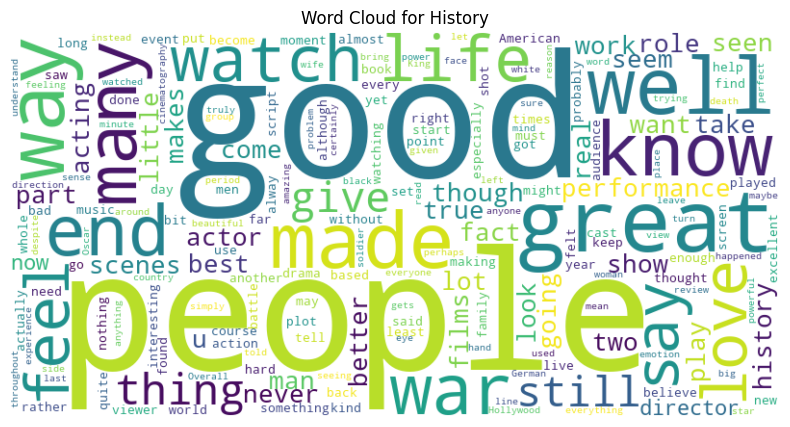

Word cloud saved for genre: Biography -> wordclouds/Biography_wordcloud.png


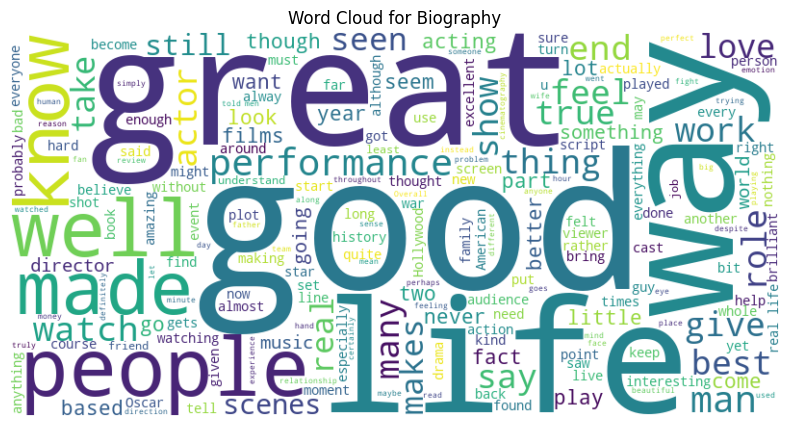

Word cloud saved for genre: War -> wordclouds/War_wordcloud.png


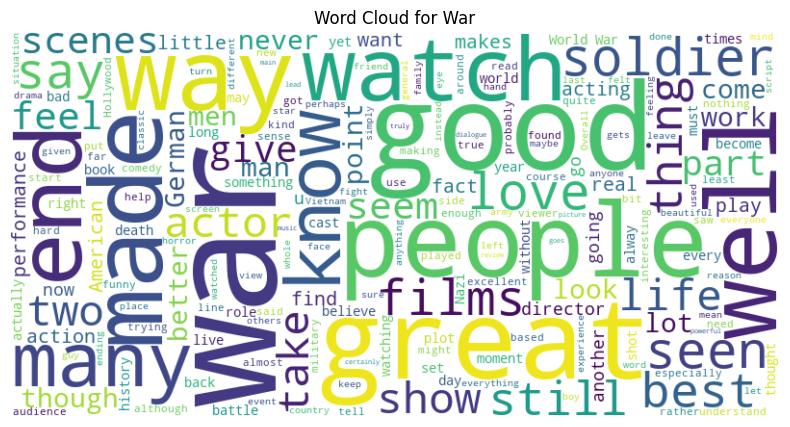

Word cloud saved for genre: Fantasy -> wordclouds/Fantasy_wordcloud.png


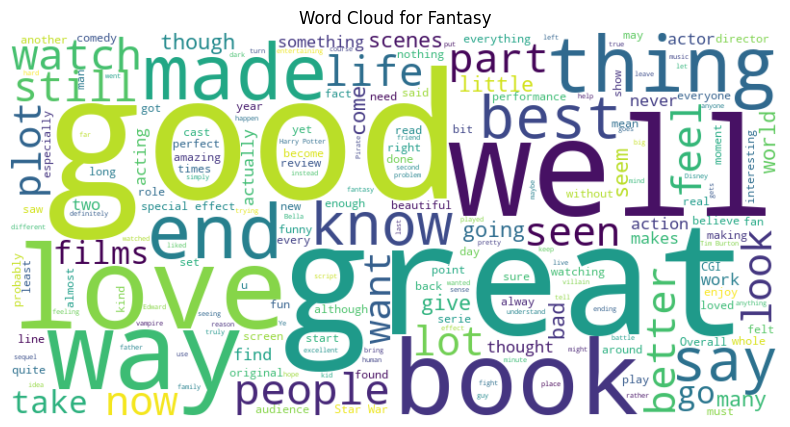

Word cloud saved for genre: Adventure -> wordclouds/Adventure_wordcloud.png


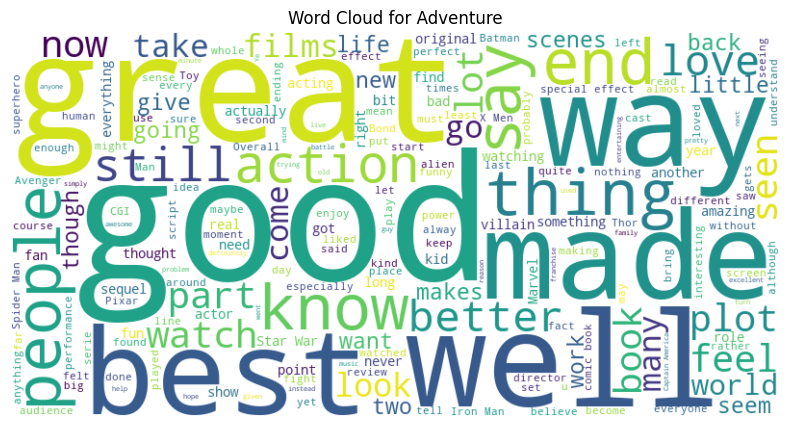

Word cloud saved for genre: Comedy -> wordclouds/Comedy_wordcloud.png


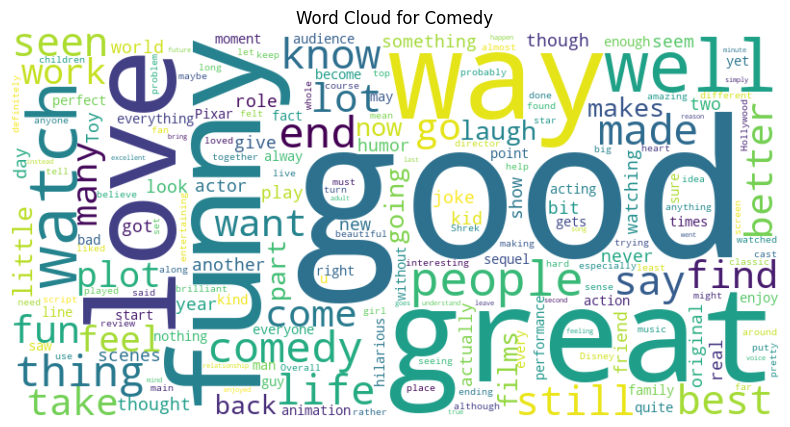

Word cloud saved for genre: Action -> wordclouds/Action_wordcloud.png


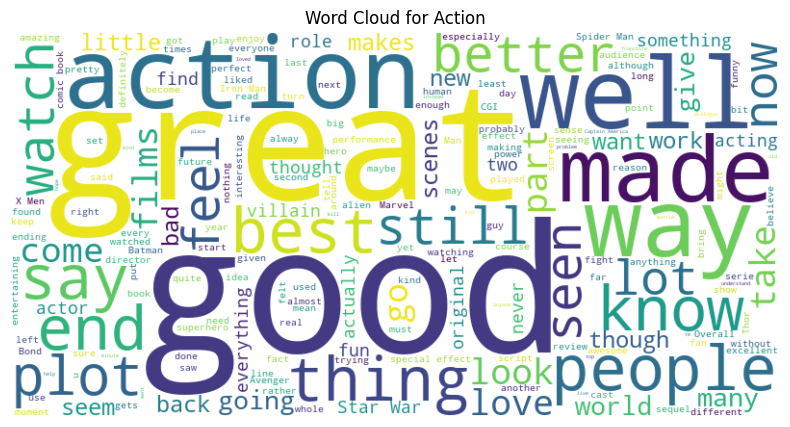

Word cloud saved for genre: Sport -> wordclouds/Sport_wordcloud.png


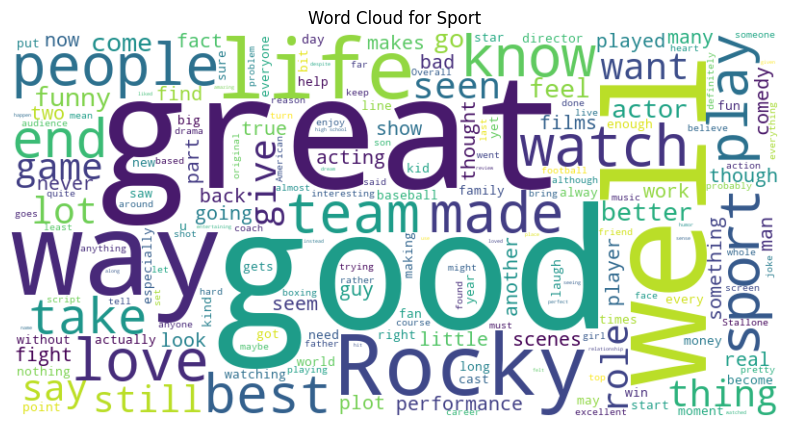

Word cloud saved for genre: Music -> wordclouds/Music_wordcloud.png


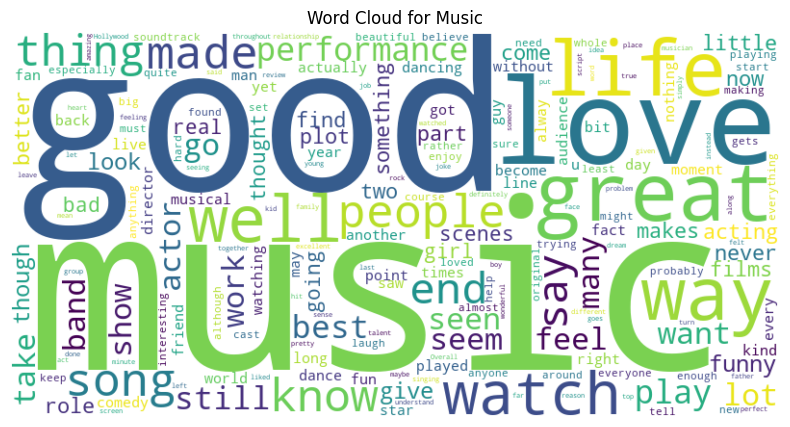

Word cloud saved for genre: Animation -> wordclouds/Animation_wordcloud.png


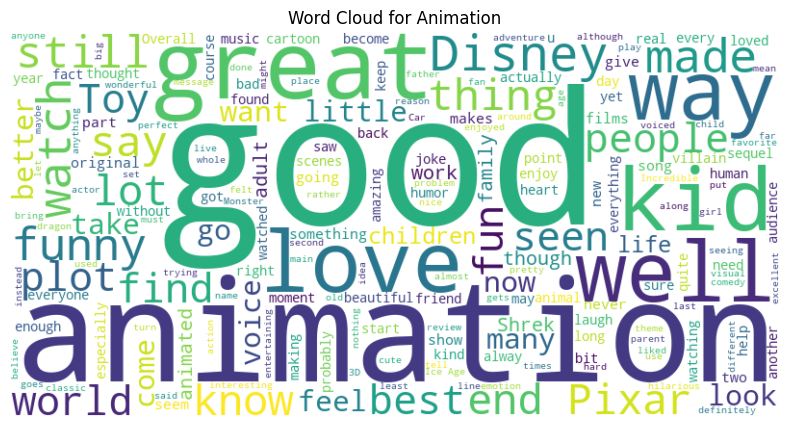

In [9]:

def normalize_title(title):
    # Remove years in the format "(YYYY)" or "YYYY"
    title = re.sub(r"\s*\(\d{4}\)", "", title)
    title = re.sub(r"\s+\d{4}$", "", title)
    # Strip extra spaces
    return title.strip()

def generate_word_clouds_by_genre_fixed(sentiment_df, reviews_folder_path, max_reviews=100, output_folder="wordclouds"):
    
    """ Generates word clouds for each genre based on user reviews. """
    
    genre_column = 'genre'
    
    # Explode the genre column into separate rows (some movies have multiple genres)
    exploded_df = sentiment_df.explode(genre_column).dropna(subset=[genre_column])
    
    # Normalize movie titles in the DataFrame (remove release year)
    exploded_df['normalized_movie'] = exploded_df['movie'].apply(normalize_title)
    
    # Create a dictionary to hold all text for each genre
    genre_texts = {genre: [] for genre in exploded_df[genre_column].unique()}

    # Additional stopwords added that appear frequently in the reviews and are non-specific to genre
    custom_stopwords = STOPWORDS.union({
        "movie", "film", "br", "one", "movies", "see", "time", "really", 
        "make", "much", "think", "scene", "character", "story", "characters", 
        "even", "will", "first"
    })

    # Iterate through the reviews folder
    for file_name in os.listdir(reviews_folder_path):
        if file_name.endswith(".csv"):
            # Normalize the movie title from the file name
            movie_title = normalize_title(os.path.splitext(file_name)[0])
            
            # Get genres for the current movie
            genres = exploded_df.loc[exploded_df['normalized_movie'] == movie_title, genre_column].dropna().unique()
            if not genres.any():  # Skip movies without matching genres
                print(f"No matching genres found for movie: {movie_title}")
                continue
            
            # Extract reviews and combine into text
            try:
                review_file = os.path.join(reviews_folder_path, file_name)
                movie_reviews = pd.read_csv(review_file)
                sampled_reviews = movie_reviews['review'].dropna().sample(
                    n=max_reviews, replace=False, random_state=42
                ) if len(movie_reviews) > max_reviews else movie_reviews['review'].dropna()
                combined_text = " ".join(sampled_reviews)
                
                # Add the text to each associated genre
                for genre in genres:
                    genre_texts[genre].append(combined_text)
            except Exception as e:
                print(f"Error processing reviews for movie: {movie_title}. Error: {e}")

    # Combine all text blocks for each genre
    for genre in genre_texts:
        genre_texts[genre] = " ".join(genre_texts[genre])

    # Generate word clouds for each genre
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for genre, text in genre_texts.items():
        if text.strip():
            try:
                wordcloud = WordCloud(
                    width=800,
                    height=400,
                    background_color='white',
                    stopwords=custom_stopwords
                ).generate(text)
                
                # Save the word cloud as an image file
                output_file = os.path.join(output_folder, f"{genre}_wordcloud.png")
                wordcloud.to_file(output_file)
                print(f"Word cloud saved for genre: {genre} -> {output_file}")
                
                # Optionally display the word cloud
                plt.figure(figsize=(10, 5))
                plt.imshow(wordcloud, interpolation='bilinear')
                plt.title(f"Word Cloud for {genre}")
                plt.axis("off")
                plt.show()
            except Exception as e:
                print(f"Error generating word cloud for genre: {genre}. Error: {e}")

generate_word_clouds_by_genre_fixed(
    movie_sentiments_with_genres_and_ratings,
    folder_path,
    max_reviews=100,
    output_folder="wordclouds")


Above are wordclouds representing the text in a sample of 100 reviews for each genre. This should give us an idea what the most frequent words are in the reviews for each genre. The words 'good' and 'great' are large in all wordclouds and therefore appear frequently accross genres. What is interesting about the clouds are the negative words for certain genres. In the War wordcloud the words 'war', 'death', 'horror' and 'battle' can be spotted. These words have a very low happiness average in the labMT word list and drag the sentiment of the genre down. Similar words cannot be seen in the Comedy genre for example, where most of the words are positive and some neutral.

## The network

### Load and process data

- Combine all data into one merged dataframe.

- Loading, merging, and transforming the datasets to create a dataset of movies, including their genres, ratings, reviews, sentiment scores, and associated tags. 

- Nested structures for ratings, reviews, and tags grouped by movie.

- The result is a detailed, merged dataset (merged_df) combining everything for further analysis.


**Processing includes:**
- Rows with missing average_sentiment values are excluded.
- Ratings, reviews, and scores are filtered to only include movieId values present in the nested_df.
- Movie titles are split to extract the release year, and the year is stored in a separate column.

In [10]:
# Grouplens data
scores = pd.read_csv('grouplens_data/ml-latest/genome-scores.csv')
tags = pd.read_csv('grouplens_data/ml-latest/genome-tags.csv')
links = pd.read_csv('grouplens_data/ml-latest/links.csv')
movies = pd.read_csv('grouplens_data/ml-latest/movies.csv')
ratings_file_path = 'grouplens_data/ml-latest/ratings.csv'

# Collect the reviews from the dataset and save them in a CSV file. 
movies_dict = {}

for index, row in movies.iterrows():
    clean_title = row['title'][:-7].strip() 
    movies_dict[row['movieId']] = clean_title


all_reviews = []
# Collect reviews from each file, sample 100 reviews per movie, and save them in a list
for filename in os.listdir(folder_path):
    if filename.endswith(".csv"):
        title_with_year = filename[:-4]  
        title = title_with_year.rsplit(' ', 1)[0]  
        movieId = [key for key, value in movies_dict.items() if value == title]

        if movieId:  
            movieId = movieId[0]  
            file_path = os.path.join(folder_path, filename)
            
            reviews_df = pd.read_csv(file_path)
            
            if 'review' in reviews_df.columns:
                sampled_reviews = reviews_df['review'].sample(
                    n=min(100, len(reviews_df)), random_state=42
                ).tolist()
                
                for review in sampled_reviews:
                    all_reviews.append({
                        "movieId": movieId,
                        "movieTitle": title,
                        "review": review
                    })


reviews_df = pd.DataFrame(all_reviews)

output_path = "sampled_reviews.csv"
reviews_df.to_csv(output_path, index=False)

print("Sampled reviews collected and saved successfully!")

# Sentiment analysis
sentiment_scores_file_path = 'movie_sentiment_scores.csv'  

ratings_df = pd.read_csv(ratings_file_path)

average_ratings = ratings_df.groupby('movieId').agg(
    average_rating=('rating', 'mean'),
    rating_count=('rating', 'count')
).reset_index()

reviews_sampled_df = pd.read_csv(output_path)

def compute_sentiment(review, sentiment_dict):
    review = review.translate(str.maketrans('', '', string.punctuation)).lower()
    words = review.split()
    sentiment_scores = [sentiment_dict[word] for word in words if word in sentiment_dict]
    return np.mean(sentiment_scores) if sentiment_scores else None

happiness_dict = load_sentiment_word_list(word_list_path)
reviews_sampled_df['sentiment_score'] = reviews_sampled_df['review'].apply(lambda r: compute_sentiment(r, happiness_dict))

movie_sentiments = reviews_sampled_df.groupby('movieId').agg(
    average_sentiment=('sentiment_score', 'mean'),
    review_count=('sentiment_score', 'count')
).reset_index()



comparison_df = pd.merge(average_ratings, movie_sentiments, on='movieId', how='inner')



# IMBd data
genre_folder_path = "dataset/1_movies_per_genre/"  
all_files = glob.glob(genre_folder_path + "*.csv")
list_dataframes = []

for filename in all_files:
    df = pd.read_csv(filename)
    list_dataframes.append(df)

# All movies in one dataframe
movies_df = pd.concat(list_dataframes, ignore_index=True)

# Nested dataframe for everything
nested_df = pd.merge(movies, movie_sentiments, on="movieId", how="left")
nested_df = pd.merge(nested_df, comparison_df, on="movieId", how="left", suffixes=("", "_rating"))
nested_df = pd.merge(nested_df, links, on="movieId", how="left")

nested_df = nested_df[nested_df['average_sentiment'].notna()]

ratings = ratings_df[ratings_df['movieId'].isin(nested_df['movieId'])]
reviews = reviews_sampled_df[reviews_sampled_df['movieId'].isin(nested_df['movieId'])]
scores = scores[scores['movieId'].isin(nested_df['movieId'])]
ratings_nested = ratings.groupby('movieId').apply(lambda x: x[['userId', 'rating', 'timestamp']].to_dict(orient='records')).reset_index(name='ratings')
reviews_nested = reviews.groupby('movieId').apply(lambda x: x[['review']].to_dict(orient='records')).reset_index(name='reviews')
tags_nested = scores.merge(tags, on='tagId').groupby('movieId').apply(lambda x: x[['tag', 'relevance']].to_dict(orient='records')).reset_index(name='tags')

nested_df = pd.merge(nested_df, ratings_nested, on="movieId", how="left")
nested_df = pd.merge(nested_df, reviews_nested, on="movieId", how="left")
nested_df = pd.merge(nested_df, tags_nested, on="movieId", how="left")
nested_df = nested_df[['movieId', 'title', 'genres', 'average_sentiment', 'ratings', 'reviews', 'tags','average_rating']]

nested_df['year'] = nested_df['title'].str.extract(r'\((\d{4})\)').astype(int)
nested_df['title'] = nested_df['title'].str.replace(r'\s*\(\d{4}\)', '', regex=True)

# Final merged dataframe
merged_df = pd.merge(movies_df, nested_df, left_on="name", right_on="title", how="inner")


Sampled reviews collected and saved successfully!


/var/folders/06/l7w93lb13l7f94htvwv84z2c0000gn/T/ipykernel_31879/50190002.py:102: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ratings_nested = ratings.groupby('movieId').apply(lambda x: x[['userId', 'rating', 'timestamp']].to_dict(orient='records')).reset_index(name='ratings')
/var/folders/06/l7w93lb13l7f94htvwv84z2c0000gn/T/ipykernel_31879/50190002.py:103: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  re

## Building the network
The graph:
- Nodes: Represent movies (movieId).
- Edges: Exist between two nodes (movies) if they share a certain threshold of common tags (in this case, 5 or more tags).
- Edge Weights: The weight of each edge corresponds to the number of shared tags between the connected movies.


Compute the number of nodes and edges and plot the degree distribution.

In [11]:
# Network analysis
num_sorted = 50
num_shared = 7

movie_top_tags = {}
for _, row in merged_df.iterrows():
    movie_id = row['movieId']
    tags = row['tags']
    
    if isinstance(tags, list) and all(isinstance(tag, dict) for tag in tags):
        sorted_tags = sorted(tags, key=lambda x: x['relevance'], reverse=True)
        movie_top_tags[movie_id] = [tag['tag'] for tag in sorted_tags[:num_sorted]]
    else:
        movie_top_tags[movie_id] = []

movie_ids = merged_df['movieId'].unique()

G_tags = nx.Graph()

for movie1, movie2 in combinations(movie_ids, 2):
    tags1 = movie_top_tags.get(movie1, [])
    tags2 = movie_top_tags.get(movie2, [])
    shared_tags = set(tags1) & set(tags2)
    if len(shared_tags) >= num_shared:
        G_tags.add_edge(movie1, movie2, weight=len(shared_tags))

print("Numer of nodes: ", len(G_tags.nodes))
print("Numer of edges: ", len(G_tags.edges))

Numer of nodes:  831
Numer of edges:  196554


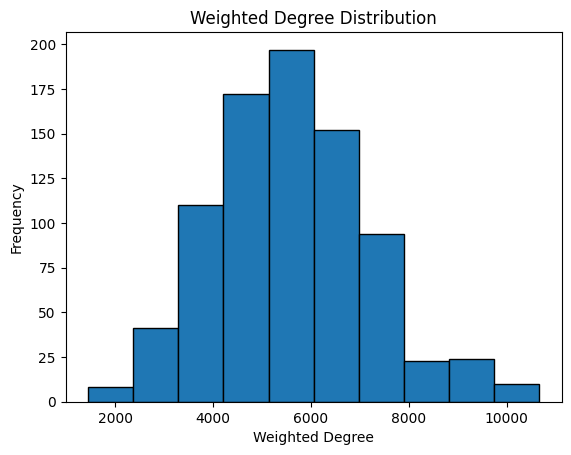

In [12]:
weighted_degrees = [sum(data['weight'] for _, _, data in G_tags.edges(node, data=True)) for node in G_tags.nodes()]

plt.hist(weighted_degrees, bins=10, edgecolor='k')
plt.xlabel("Weighted Degree")
plt.ylabel("Frequency")
plt.title("Weighted Degree Distribution")
plt.show()


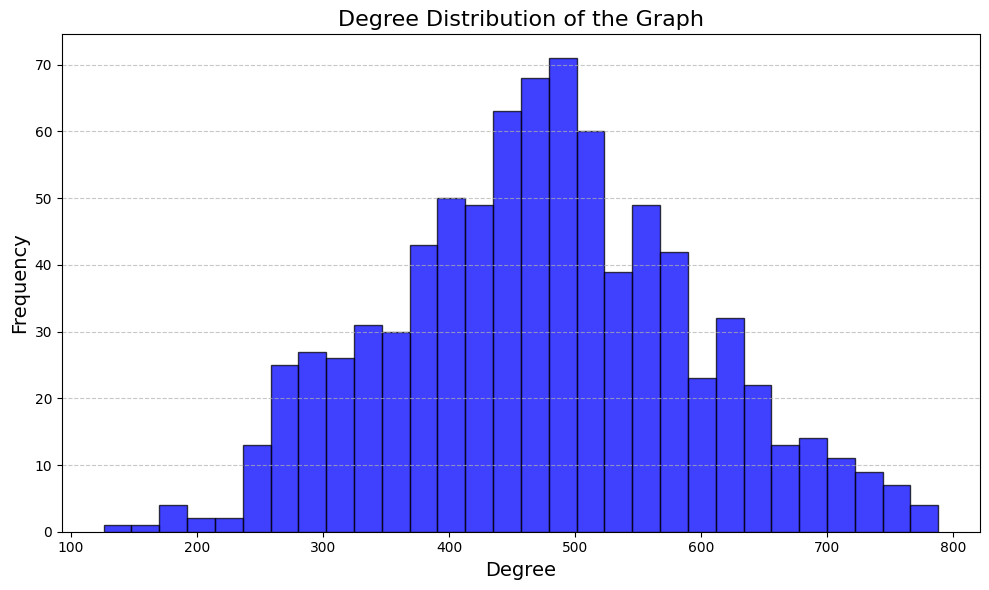

In [13]:
degrees = dict(G_tags.degree())

sorted_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
degrees = dict(G_tags.degree())
degree_values = list(degrees.values())

plt.figure(figsize=(10, 6))
plt.hist(degree_values, bins=30, alpha=0.75, color='blue', edgecolor='black')
plt.title('Degree Distribution of the Graph', fontsize=16)
plt.xlabel('Degree', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Louvain Communities
- Detecting Louvain communities
- Creating a visualization of the communities, using sentiment scores for node coloring.
- Highlighting community boundaries using convex hulls and position nodes in a way that clusters communities visually.
- Creating a summary dataframe for the communities

Plotting the number of nodes in each community.

Generating visual representation of the top tags in each community and the community distribution for each genre.

Number of communities detected: 3


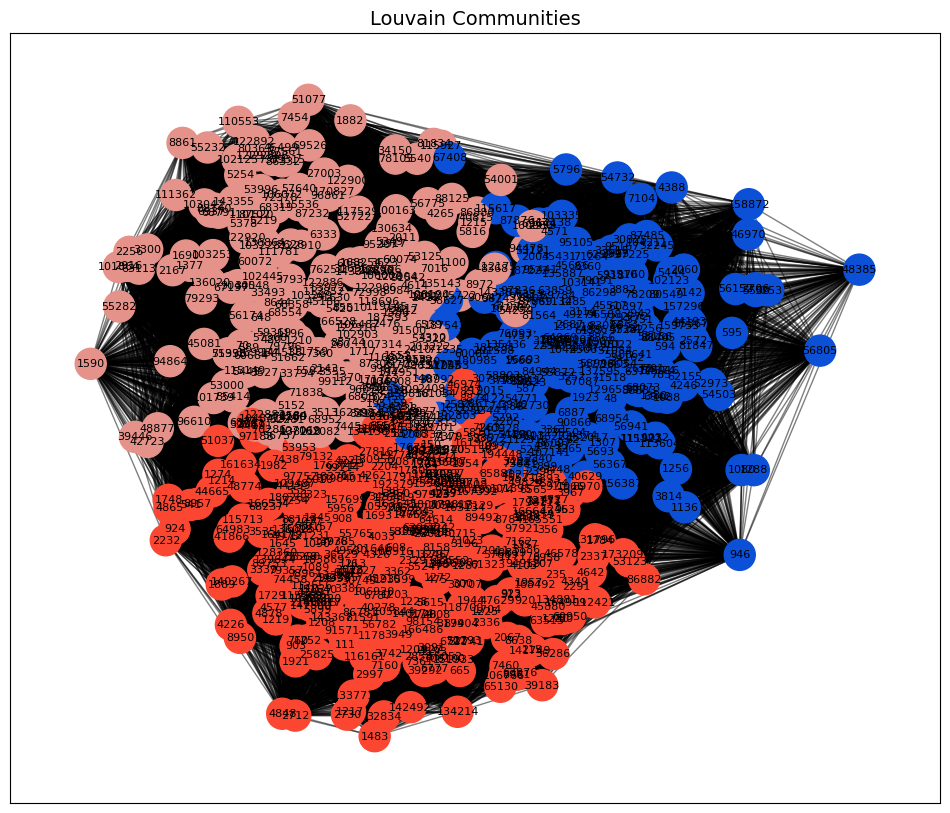

In [14]:

communities = louvain_communities(G_tags, weight="weight")
print(f"Number of communities detected: {len(communities)}")

color_map = {}
for idx, community in enumerate(communities):
    color = f"#{random.randint(0, 0xFFFFFF):06x}"  
    for node in community:
        color_map[node] = color

node_colors = [color_map[node] for node in G_tags.nodes()]

plt.figure(figsize=(12, 10))

pos = nx.spring_layout(G_tags)  
nx.draw_networkx_nodes(G_tags, pos,node_color=node_colors, node_size=500)
nx.draw_networkx_edges(G_tags,pos, alpha=0.5)
nx.draw_networkx_labels(G_tags, pos,font_size=8, font_color="black")

plt.title("Louvain Communities", fontsize=14)
plt.show()

/var/folders/06/l7w93lb13l7f94htvwv84z2c0000gn/T/ipykernel_31879/1449735500.py:79: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper right', fontsize=10)


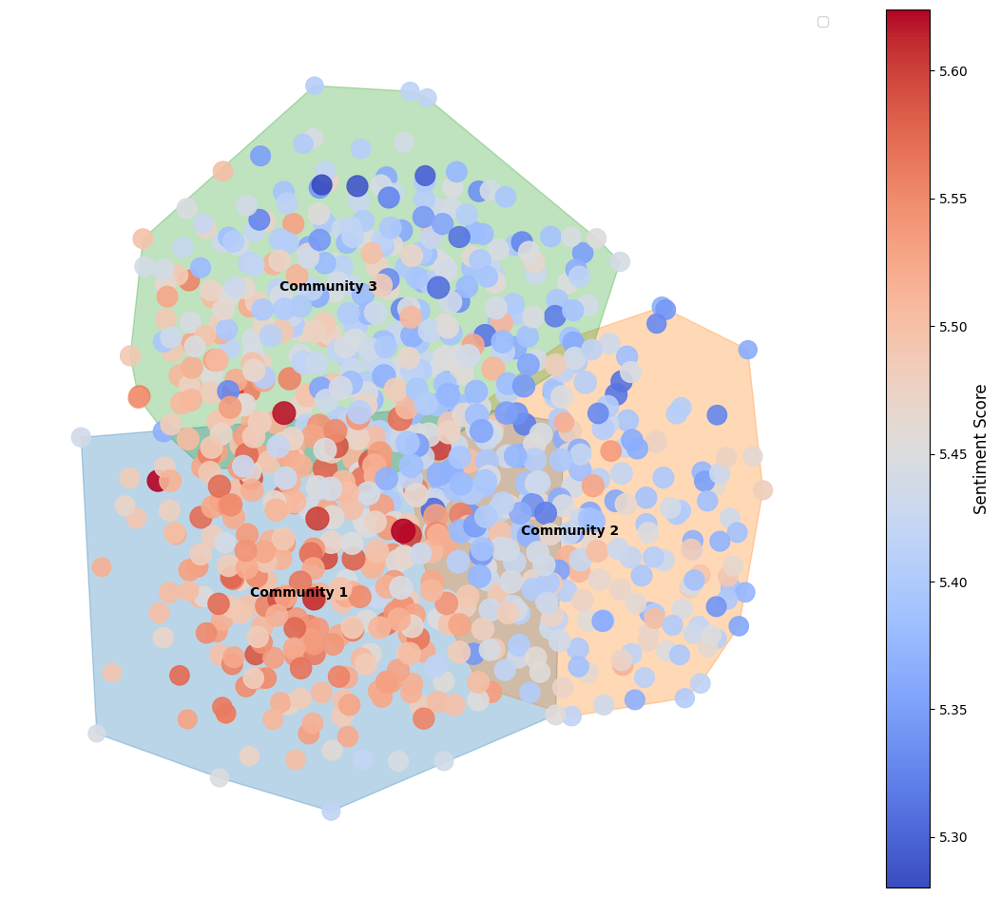

In [15]:
sentiment_scores = {row['movieId']: row['average_sentiment'] for _, row in merged_df.iterrows()}
min_sentiment = min(sentiment_scores.values())
max_sentiment = max(sentiment_scores.values())
normalized_sentiments = {
    node: (sentiment_scores.get(node, 0) - min_sentiment) / (max_sentiment - min_sentiment)
    for node in G_tags.nodes()
}
colormap = plt.cm.coolwarm
node_colors = [colormap(normalized_sentiments[node]) for node in G_tags.nodes()]

centrality = nx.betweenness_centrality(G_tags, normalized=True)

degrees = dict(G_tags.degree())
min_degree = min(degrees.values())
max_degree = max(degrees.values())

node_sizes = [degrees[node] for node in G_tags.nodes()]
node_sizes = [50 + (degrees[node] ** 0.5) * 10 for node in G_tags.nodes()]


pos = nx.spring_layout(G_tags, k=0.15, iterations=100)

fig, ax = plt.subplots(figsize=(14, 12))

colors = list(mcolors.TABLEAU_COLORS.values())
if len(communities) > len(colors):
    colors += list(mcolors.CSS4_COLORS.values())[:len(communities) - len(colors)]

patches = []
for i, community in enumerate(communities):
    community_pos = np.array([pos[node] for node in community if node in pos])
    if len(community_pos) > 2:  
        hull = ConvexHull(community_pos)
        polygon = [community_pos[vertex] for vertex in hull.vertices]
        polygon.append(polygon[0])  
        polygon = np.array(polygon)
        patches.append(Polygon(polygon, closed=True, color=colors[i % len(colors)], alpha=0.3, label=f"Community {i+1}"))

        centroid_x = np.mean(polygon[:, 0])
        centroid_y = np.mean(polygon[:, 1])

        ax.text(
            centroid_x,
            centroid_y,
            f"Community {i+1}",
            fontsize=10,
            fontweight="bold",
            color="black",
            ha="center",
            va="center",
        )

patch_collection = PatchCollection(patches, match_original=True)
ax.add_collection(patch_collection)

nx.draw_networkx_nodes(
    G_tags,
    pos,
    node_color=node_colors,
    node_size=node_sizes,
    alpha=0.9,
    ax=ax,
)
nx.draw_networkx_edges(
    G_tags,
    pos,
    alpha=0.0015,
    width=[1.5 * G_tags[u][v].get("weight", 1) for u, v in G_tags.edges()],
    edge_color="gray",
    ax=ax,
)

sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=min_sentiment, vmax=max_sentiment))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label("Sentiment Score", fontsize=12)


ax.legend(loc='upper right', fontsize=10)
plt.axis("off")  
plt.show()


In [16]:


community_summary = []

for community_idx, movies in enumerate(communities):
    community_movies = merged_df[merged_df['movieId'].isin(movies)]
    
    num_movies = len(community_movies)
    
    tags = []
    for movie in movies:
        tags.extend(movie_top_tags.get(movie, []))
    top_tags = Counter(tags).most_common(10)
    top_tags_str = ", ".join([f"{tag} ({count})" for tag, count in top_tags])
    
    genre_counts = community_movies['genres_y'].str.split('|').explode().value_counts(normalize=True) * 100
    genre_distribution = ", ".join([f"{genre}: {count:.1f}%" for genre, count in genre_counts.items()])
    
    community_summary.append({
        "Community": community_idx + 1,
        "Number of Movies": num_movies,
        "Top Tags": top_tags_str,
        "Genre Distribution": genre_distribution
    })

community_summary_df = pd.DataFrame(community_summary)



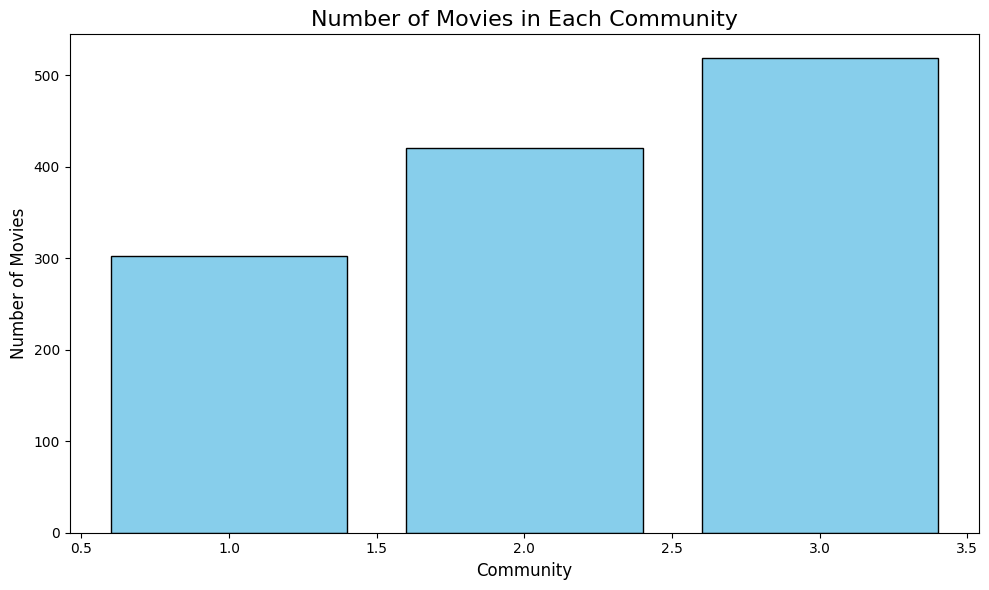

In [17]:
plt.figure(figsize=(10, 6))
plt.bar(
    community_summary_df['Community'],
    community_summary_df['Number of Movies'],
    color='skyblue',
    edgecolor='black'
)
plt.title("Number of Movies in Each Community", fontsize=16)
plt.xlabel("Community", fontsize=12)
plt.ylabel("Number of Movies", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


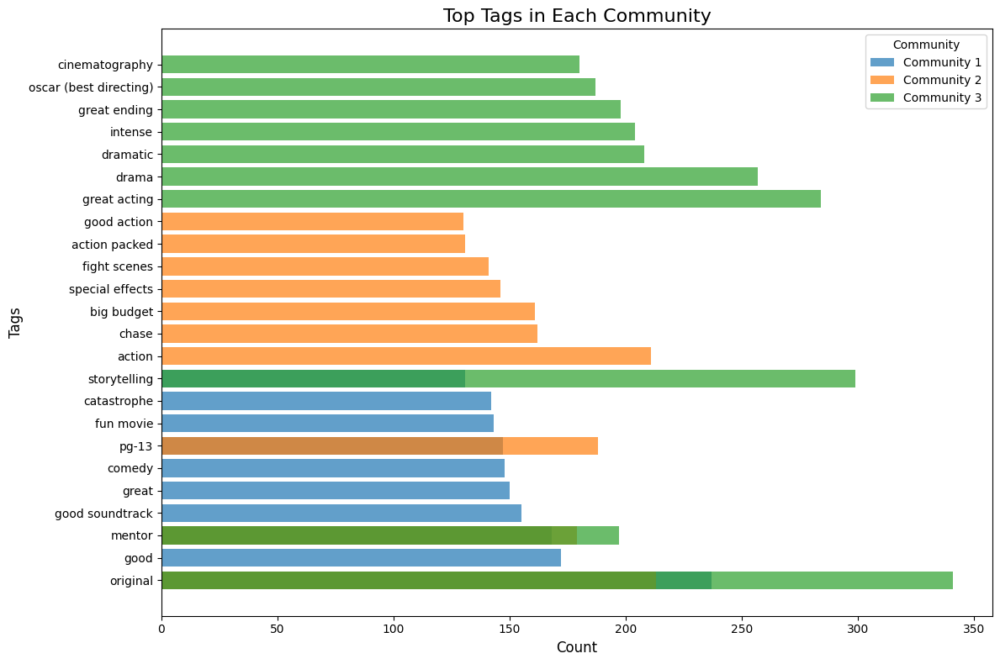

In [18]:

top_tags_data = []
for _, row in community_summary_df.iterrows():
    for tag_info in row['Top Tags'].split(", "):
        tag, count = tag_info.rsplit(" (", 1)  
        count = int(count.strip(")"))  
        top_tags_data.append({
            "Community": row['Community'],
            "Tag": tag,
            "Count": count
        })

top_tags_df = pd.DataFrame(top_tags_data)



top_tags_df = pd.DataFrame(top_tags_data)

plt.figure(figsize=(12, 8))
for community in top_tags_df['Community'].unique():
    subset = top_tags_df[top_tags_df['Community'] == community]
    plt.barh(
        subset['Tag'],
        subset['Count'],
        label=f"Community {community}",
        alpha=0.7
    )

plt.title("Top Tags in Each Community", fontsize=16)
plt.xlabel("Count", fontsize=12)
plt.ylabel("Tags", fontsize=12)
plt.legend(title="Community", fontsize=10)
plt.tight_layout()
plt.show()


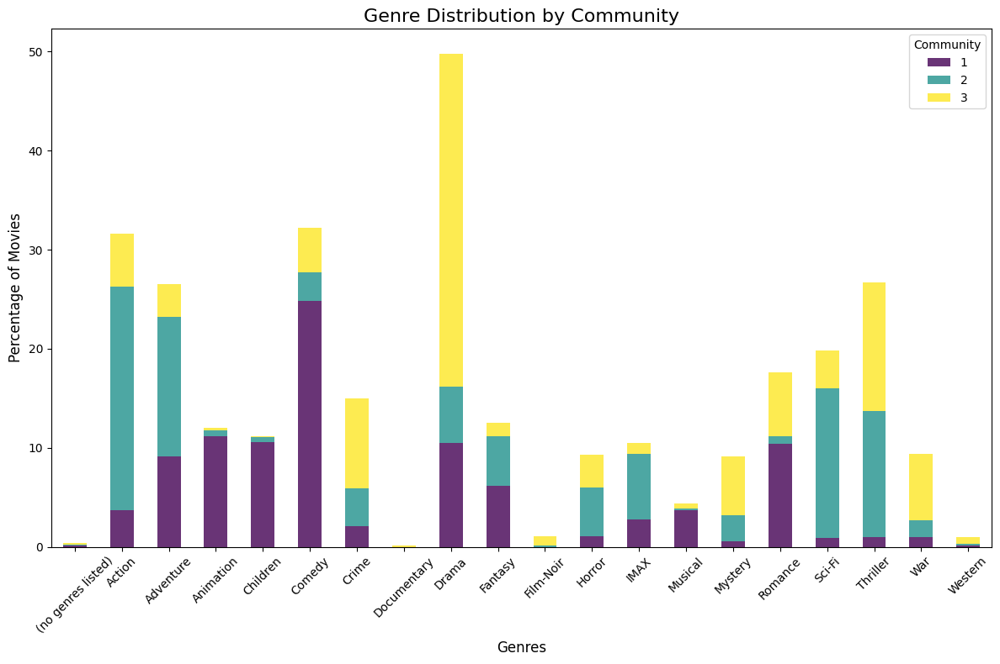

In [19]:
genre_data = []
for _, row in community_summary_df.iterrows():
    for genre_info in row['Genre Distribution'].split(", "):
        genre, percentage = genre_info.split(": ")
        percentage = float(percentage.strip("%"))
        genre_data.append({
            "Community": row['Community'],
            "Genre": genre,
            "Percentage": percentage
        })

genre_df = pd.DataFrame(genre_data)

pivot_genre = genre_df.pivot(index="Genre", columns="Community", values="Percentage").fillna(0)

pivot_genre.plot(
    kind="bar",
    stacked=True,
    figsize=(12, 8),
    colormap="viridis",
    alpha=0.8
)
plt.title("Genre Distribution by Community", fontsize=16)
plt.xlabel("Genres", fontsize=12)
plt.ylabel("Percentage of Movies", fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.legend(title="Community", fontsize=10)
plt.tight_layout()
plt.show()


In [20]:
# Adding the communities into the dataframe for further analysis.
community_mapping = {}

for community_id, movie_ids in enumerate(communities, start=1):
    for movie_id in movie_ids:
        community_mapping[movie_id] = int(community_id)

merged_df["Community"] = merged_df["movieId"].map(community_mapping)


## Analyse the genres and the communities

In [21]:


movie_genres = {row['movieId']: row['genres_y'].split('|') for _, row in merged_df.iterrows()}

community_genre_stats = []
for idx, community in enumerate(communities):
    community_genres = []
    for movie in community:
        if movie in movie_genres:
            community_genres.extend(movie_genres[movie])
    
    genre_counts = Counter(community_genres)
    community_genre_stats.append({
        "Community": idx + 1,
        "Size": len(community),
        "Top Genres": genre_counts.most_common(5),  
        "Genre Distribution": genre_counts
    })

genre_df = pd.DataFrame(community_genre_stats)





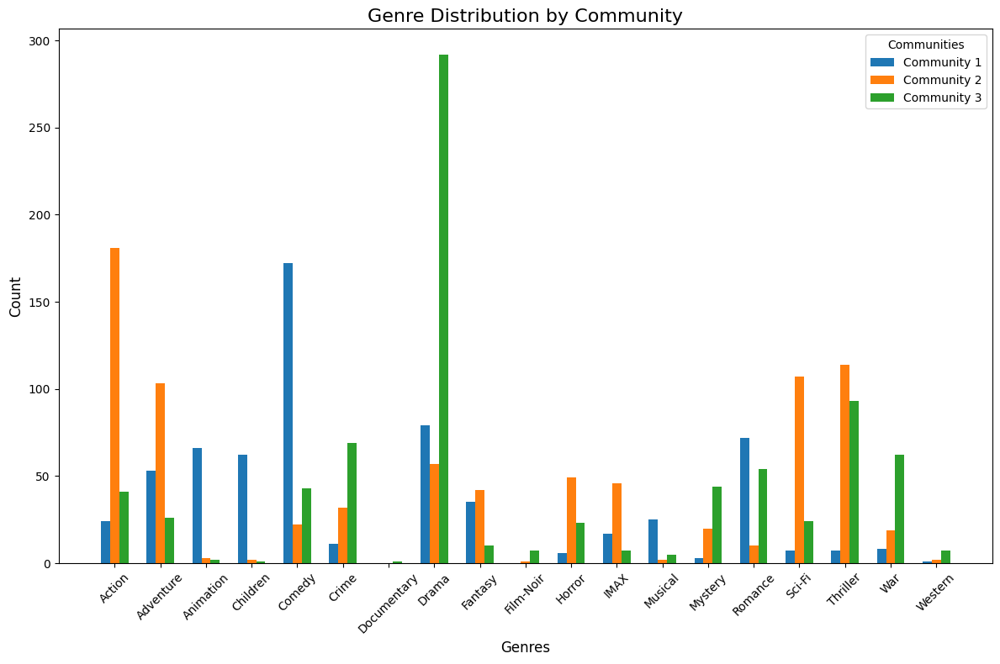

In [22]:
flattened_data = []
for idx, row in genre_df.iterrows():
    community = row['Community']
    genre_distribution = row['Genre Distribution']
    for genre, count in genre_distribution.items():
        if genre != '(no genres listed)':
            flattened_data.append({"Community": community, "Genre": genre, "Count": count})

flattened_df = pd.DataFrame(flattened_data)

pivot_df = flattened_df.pivot(index="Genre", columns="Community", values="Count").fillna(0)

bar_width = 0.2
x = np.arange(len(pivot_df.index))  

plt.figure(figsize=(12, 8))

for idx, community in enumerate(pivot_df.columns):
    plt.bar(
        x + idx * bar_width,  
        pivot_df[community], 
        bar_width, 
        label=f"Community {community}"
    )

plt.title("Genre Distribution by Community", fontsize=16)
plt.xlabel("Genres", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(x + bar_width, pivot_df.index, rotation=45, fontsize=10)  
plt.legend(title="Communities", fontsize=10)
plt.tight_layout()

plt.show()


## Detailed community summaries

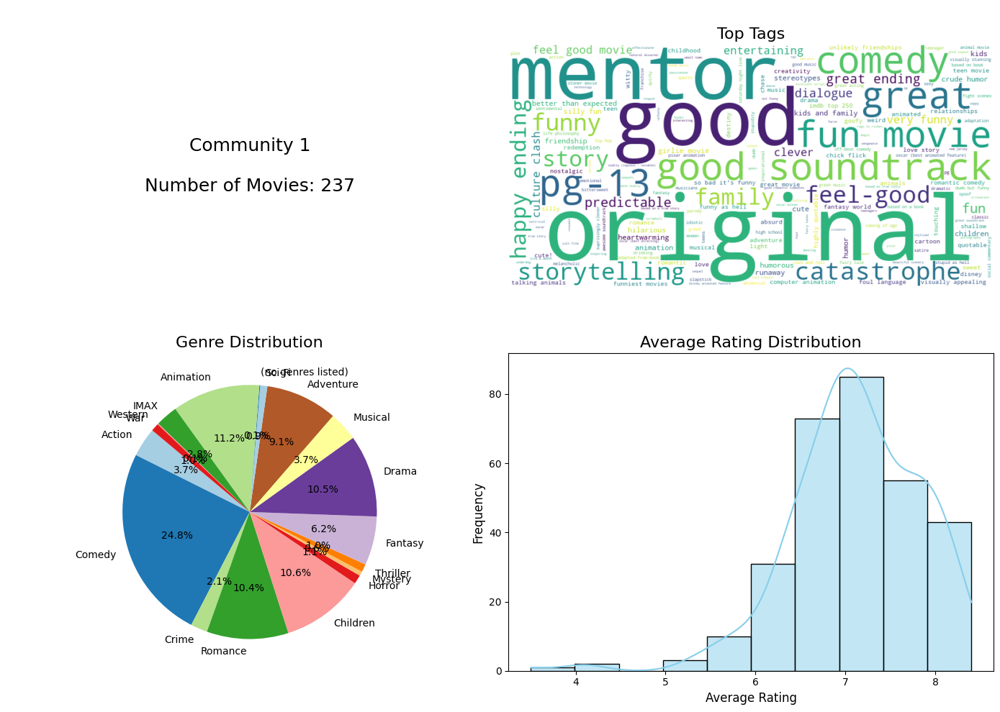

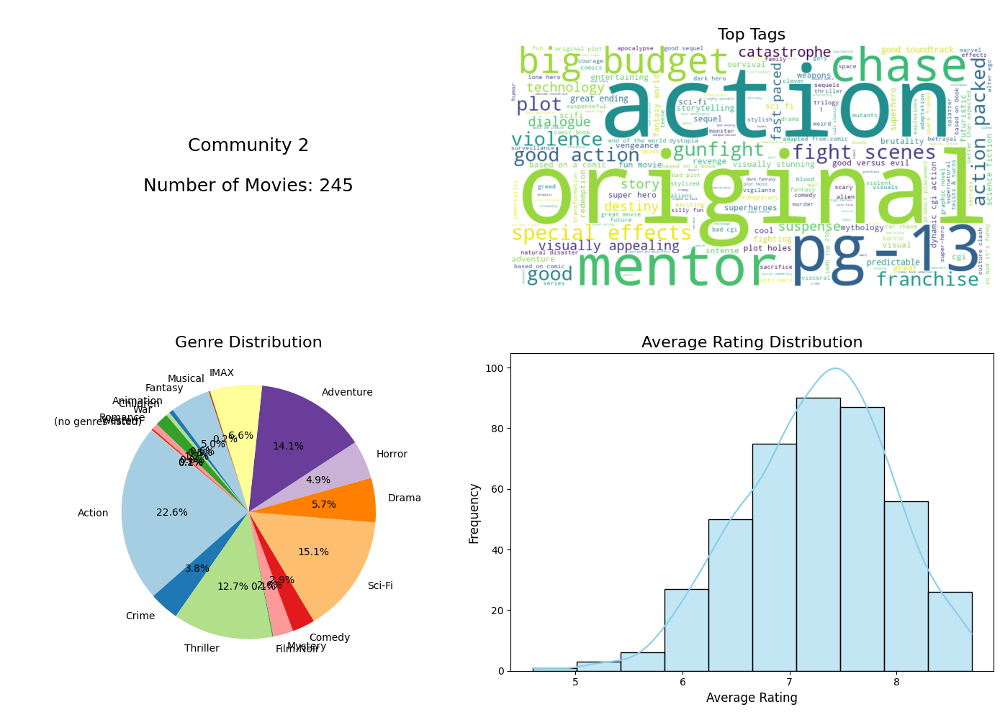

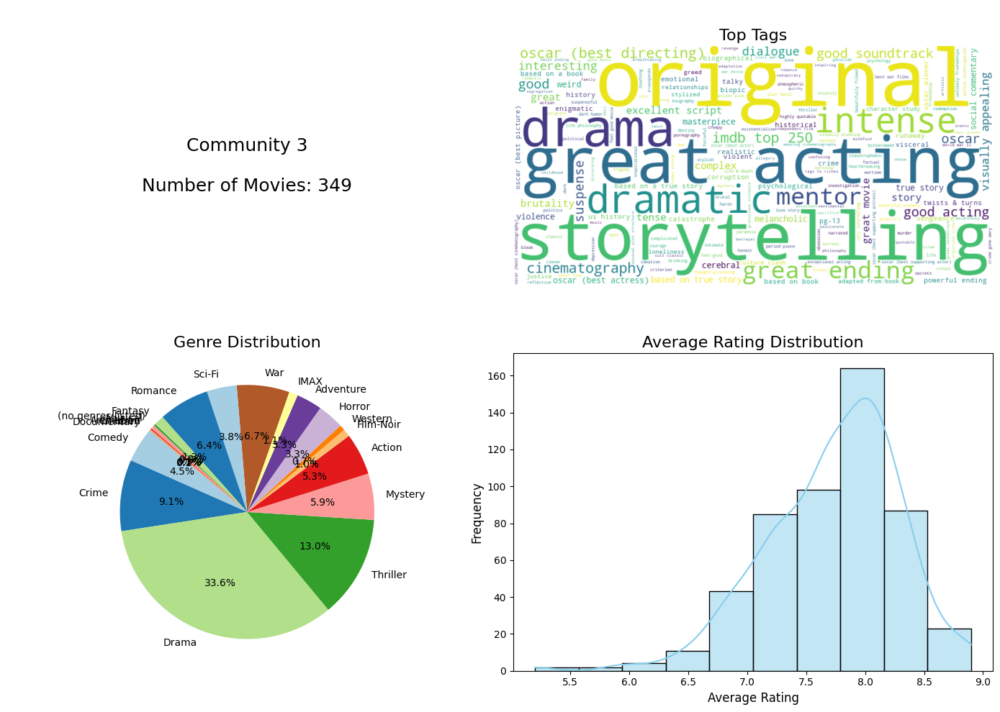

In [23]:


def create_community_summary(community_id, movies, tags, genres, ratings):
    plt.figure(figsize=(14, 10))

    plt.subplot(2, 2, 1)
    plt.text(0.5, 0.5, 
             f"Community {community_id}\n\nNumber of Movies: {len(movies)}", 
             fontsize=18, ha='center', va='center', wrap=True)
    plt.axis('off')
    
    plt.subplot(2, 2, 2)
    wc = WordCloud(background_color='white', colormap='viridis', width=800, height=400)
    tag_counts = Counter(tags)
    wc.generate_from_frequencies(tag_counts)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')
    plt.title("Top Tags", fontsize=16)
    
    plt.subplot(2, 2, 3)
    genre_counts = Counter(genres)
    labels = list(genre_counts.keys())
    sizes = list(genre_counts.values())
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
    plt.title("Genre Distribution", fontsize=16)
    
    plt.subplot(2, 2, 4)
    sns.histplot(ratings, kde=True, bins=10, color='skyblue', edgecolor='black')
    plt.title("Average Rating Distribution", fontsize=16)
    plt.xlabel("Average Rating", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    
    plt.tight_layout()
    plt.savefig(f"community_{community_id}_summary.png")
    plt.show()

for community_id, movies in enumerate(communities, start=1):
    community_movies = merged_df[merged_df['movieId'].isin(movies)]
    
    community_tags = []
    for movie in movies:
        community_tags.extend(movie_top_tags.get(movie, []))
    
    community_genres = community_movies['genres_y'].str.split('|').explode().tolist()
    community_ratings = community_movies['rating'].dropna().tolist()
    
    create_community_summary(
        community_id=community_id,
        movies=movies,
        tags=community_tags,
        genres=community_genres,
        ratings=community_ratings
    )


## Analyse Sentiments and communities.

In [24]:
movie_sentiments = {row['movieId']: row['average_sentiment'] for _, row in merged_df.iterrows()}


community_sentiment_stats = []
for idx, community in enumerate(communities):
    community_sentiments = []
    for movie in community:
        if movie in movie_sentiments:
            community_sentiments.append(movie_sentiments[movie])  
    
    sentiment_counts = Counter(community_sentiments)
    community_sentiment_stats.append({
        "Community": idx + 1,
        "Size": len(community),
        "Top Sentiments": sentiment_counts.most_common(5),  
        "Sentiment Distribution": sentiment_counts
    })

sentiment_df = pd.DataFrame(community_sentiment_stats)

print(sentiment_df.head())

   Community  Size                                     Top Sentiments  \
0          1   237  [(5.592884160038165, 1), (5.580511496282083, 1...   
1          2   245  [(5.365982026245039, 1), (5.446399646001184, 1...   
2          3   349  [(5.465592968528391, 1), (5.45543406804541, 1)...   

                              Sentiment Distribution  
0  {5.592884160038165: 1, 5.580511496282083: 1, 5...  
1  {5.365982026245039: 1, 5.446399646001184: 1, 5...  
2  {5.465592968528391: 1, 5.45543406804541: 1, 5....  


## Analyse rating within communities

- Store the community size and average rating in a DataFrame - community_ratings_df
- Identify the top 3 most common genres for each community with their occurrence counts and store the results in a DataFrame - top_genres_df
- Plotting rating distribution for each community both in kde and boxplot

In [25]:

movie_ratings = {row['movieId']: row['rating'] for _, row in merged_df.iterrows()}


community_ratings = []
for idx, community in enumerate(communities):
    community_ratings_list = []
    for movie in community:
        if movie in movie_ratings:
            community_ratings_list.append(movie_ratings[movie])
    
    avg_rating = sum(community_ratings_list) / len(community_ratings_list) if community_ratings_list else 0
    community_ratings.append({
        "Community": idx + 1,
        "Average Rating": avg_rating,
        "Size": len(community_ratings_list)
    })

community_ratings_df = pd.DataFrame(community_ratings)

top_genres_data = []
for idx, community in enumerate(communities):
    community_movies = merged_df[merged_df['movieId'].isin(community)]
    genres = community_movies['genres_y'].str.split('|').explode()
    top_genres = Counter(genres).most_common(3)
    top_genres_data.append({
        "Community": f"Community {idx + 1}",
        "Top Genres": ", ".join([f"{genre} ({count})" for genre, count in top_genres])
    })

top_genres_df = pd.DataFrame(top_genres_data)


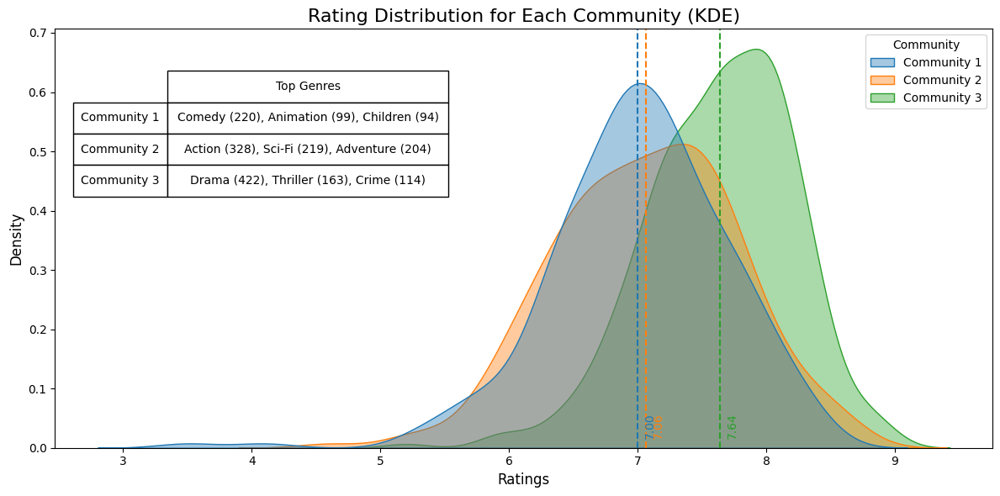

In [26]:

community_ratings_all = []

for idx, community in enumerate(communities):
    for movie in community:
        if movie in movie_ratings:
            community_ratings_all.append({"Community": f"Community {idx + 1}", "Rating": movie_ratings[movie]})

community_ratings_df = pd.DataFrame(community_ratings_all)

plt.figure(figsize=(12, 6))
sns.kdeplot(
    data=community_ratings_df,
    x="Rating",
    hue="Community",
    fill=True,
    common_norm=False,
    alpha=0.4
)
means = community_ratings_df.groupby('Community')['Rating'].mean()
for idx, (community, mean_value) in enumerate(means.items()):
    plt.axvline(mean_value, linestyle='--', color=f"C{idx}", label=f"{community} Mean: {mean_value:.2f}")
    plt.text(mean_value + 0.05, 0.02, f"{mean_value:.2f}", rotation=90, color=f"C{idx}", fontsize=10)


table_data = top_genres_df.set_index("Community")
cell_text = table_data.values
rows = table_data.index
columns = ["Top Genres"]
table = plt.table(
    cellText=cell_text,
    rowLabels=rows,
    colLabels=columns,
    cellLoc='center',
    rowLoc='center',
    loc='upper right',
    bbox=[0.12, 0.6, 0.3, 0.3]  
)

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 1.5)


plt.title("Rating Distribution for Each Community (KDE)", fontsize=16)
plt.xlabel("Ratings", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.tight_layout()
plt.show()


/var/folders/06/l7w93lb13l7f94htvwv84z2c0000gn/T/ipykernel_31879/3840734472.py:14: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(community_ratings_data, labels=community_labels, patch_artist=True)


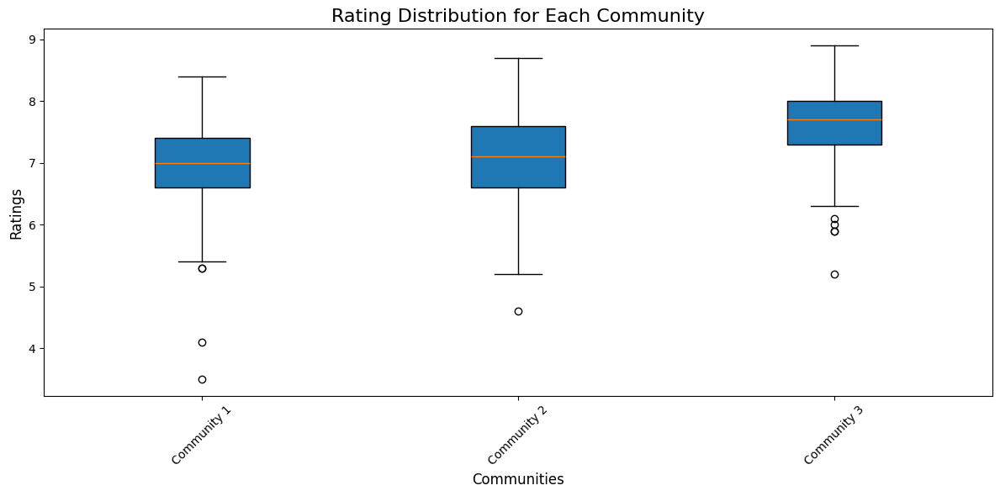

In [27]:
community_ratings_data = []
community_labels = []

for idx, community in enumerate(communities):
    community_ratings_list = []
    for movie in community:
        if movie in movie_ratings:
            community_ratings_list.append(movie_ratings[movie])
    if community_ratings_list:  
        community_ratings_data.append(community_ratings_list)
        community_labels.append(f"Community {idx + 1}")

plt.figure(figsize=(12, 6))
plt.boxplot(community_ratings_data, labels=community_labels, patch_artist=True)
plt.title("Rating Distribution for Each Community", fontsize=16)
plt.xlabel("Communities", fontsize=12)
plt.ylabel("Ratings", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Movie lengths - not used in report

In [28]:

def convert_to_minutes(runtime_str):
    if isinstance(runtime_str, str):
        hours = 0
        minutes = 0
        hour_match = re.search(r"(\d+)h", runtime_str)
        if hour_match:
            hours = int(hour_match.group(1))
        minute_match = re.search(r"(\d+)min", runtime_str)
        if minute_match:
            minutes = int(minute_match.group(1))
        return hours * 60 + minutes
    return None  

merged_df["run_length_minutes"] = merged_df["run_length"].apply(convert_to_minutes)

print(merged_df[["run_length", "run_length_minutes"]].head())


  run_length  run_length_minutes
0   2h 32min                 152
1   2h 34min                 154
2   2h 26min                 146
3   1h 51min                 111
4   1h 39min                  99


In [29]:
community_info = []

for community, group in merged_df.groupby("Community"):
    num_movies = len(group)
    avg_rating = group["rating"].mean()
    median_rating = group["rating"].median()
    genre_counts = group["genres_x"].str.split(';').explode().value_counts()
    top_genres = ", ".join(genre_counts.index[:3])  # Top 3 genres
    avg_runtime = group["run_length_minutes"].mean()

    community_info.append({
        "Community": community,
        "Number of Movies": num_movies,
        "Average Rating": round(avg_rating, 2),
        "Median Rating": round(median_rating, 2),
        "Top Genres": top_genres,
        "Average Runtime (mins)": round(avg_runtime, 2)
    })

community_info_df = pd.DataFrame(community_info)
print(community_info_df)

   Community  Number of Movies  Average Rating  Median Rating  \
0        1.0               303            7.12            7.1   
1        2.0               421            7.25            7.3   
2        3.0               519            7.73            7.8   

              Top Genres  Average Runtime (mins)  
0    , Comedy, Animation                  105.06  
1   , Action,  Adventure                  123.09  
2        ,  Drama, Drama                  129.74  


## Betweenness centrality - not used in report

In [30]:
betweenness_centrality = nx.betweenness_centrality(G_tags, normalized=True, weight="weight")

sorted_centrality = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

print("Top nodes by betweenness centrality:")
for node, centrality in sorted_centrality[:10]:  
    node = merged_df[merged_df['movieId'] == node]['name'].iloc[0]
    print(f"Node: {node}, Betweenness Centrality: {centrality:.4f}")


Top nodes by betweenness centrality:
Node: Underworld, Betweenness Centrality: 0.0028
Node: It, Betweenness Centrality: 0.0025
Node: Rango, Betweenness Centrality: 0.0024
Node: Sinister, Betweenness Centrality: 0.0023
Node: Orphan, Betweenness Centrality: 0.0023
Node: The Nice Guys, Betweenness Centrality: 0.0021
Node: The Hunger Games: Catching Fire, Betweenness Centrality: 0.0021
Node: Sweeney Todd: The Demon Barber of Fleet Street, Betweenness Centrality: 0.0020
Node: True Romance, Betweenness Centrality: 0.0020
Node: Tropic Thunder, Betweenness Centrality: 0.0020
